<a href="https://colab.research.google.com/github/sergioGarcia91/ML_Carolina_Bays/blob/main/16b_U_Net_v2_Predictions.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Start

In [ ]:
!pip install tables

In [ ]:
import numpy as np
import os
import time
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import h5py
import multiprocessing
import joblib

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, TensorDataset

# Verificar si CUDA (GPU) está disponible
if torch.cuda.is_available():
    print(f"GPU disponible: {torch.cuda.get_device_name(0)}")
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
else:
    print("GPU no disponible, usando CPU.")

GPU disponible: Tesla T4


In [ ]:
pathSaveFiguras = '/content/drive/MyDrive/UIS/Doctorado_UIS2198589/1_semestre/TopicosAvanzadosGeofisica/FC_CarolinaBais/Manuscrito_FC/Figuras_Manuscrito/'

In [ ]:
device

device(type='cuda')

In [ ]:
# Connect to Google Drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Change Font of the Figures

In [ ]:
!wget https://github.com/justrajdeep/fonts/raw/master/Times%20New%20Roman.ttf

--2025-11-11 18:48:44--  https://github.com/justrajdeep/fonts/raw/master/Times%20New%20Roman.ttf
Resolving github.com (github.com)... 140.82.121.4
Connecting to github.com (github.com)|140.82.121.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/justrajdeep/fonts/master/Times%20New%20Roman.ttf [following]
--2025-11-11 18:48:45--  https://raw.githubusercontent.com/justrajdeep/fonts/master/Times%20New%20Roman.ttf
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.110.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 834452 (815K) [application/octet-stream]
Saving to: ‘Times New Roman.ttf’

Times New Roman.ttf 100%[===================>] 814.89K  --.-KB/s    in 0.02s   

2025-11-11 18:48:45 (42.0 MB/s) - ‘Times New Roman.ttf’ saved [834452/834452]



In [ ]:
import matplotlib.font_manager as fm

In [ ]:
# Path to the custom font
font_path = 'Times New Roman.ttf'

# Add the font to the Matplotlib font manager
font_prop = fm.FontProperties(fname=font_path)
fm.fontManager.addfont(font_path)

# Get the font name to use in rcParams
font_name = font_prop.get_name()
font_name

'Times New Roman'

In [ ]:
plt.rcParams['font.family'] = font_name

# Funtions

## get_rgb

In [ ]:
def get_rgb(tif):
  rgb_image = np.dstack((tif[3],
                         tif[2],
                         tif[1]))
  return rgb_image


## normalize

In [ ]:
def normalize(img, min_percent=5, max_percent=95):
  # Adjusts the image contrast using percentiles.
  p_min, p_max = np.percentile(img, (min_percent, max_percent))
  return np.clip((img - p_min) / (p_max - p_min), 0, 1)


## normalized_index

In [ ]:
# ChatGPT

def normalized_index(B1, B2, epsilon=1e-8):
    # Añadir una pequeña constante al denominador para evitar la división por cero
    denominator = B2 + B1 + epsilon
    x = (B2 - B1) / denominator
    # Sustituir NaN y valores infinitos
    x = np.nan_to_num(x, nan=0.0, posinf=1.0, neginf=-1.0)
    # Normalizar entre 0 y 1
    x = (x + 1) / 2
    # Expande las dimensiones si es necesario
    x = np.expand_dims(x, axis=1)
    return x


## U-NET v2

https://medium.com/data-science/cook-your-first-u-net-in-pytorch-b3297a844cf3

In [ ]:
import torch
import torch.nn as nn
from torchvision import models
from torch.nn.functional import relu

In [ ]:
class UNet_v2(nn.Module):
    def __init__(self, n_class):
        super().__init__()

        # Encoder
        # In the encoder, convolutional layers with the Conv2d function are used to extract features from the input image.
        # Each block in the encoder consists of two convolutional layers followed by a max-pooling layer, with the exception of the last block which does not include a max-pooling layer.
        # -------
        # input: 256x256x7
        #self.e11 = nn.Conv2d(3, 64, kernel_size=3, padding=1) # output: 570x570x64
        self.e11 = nn.Conv2d(7, 64, kernel_size=3, padding=1) # output: 570x570x64
        self.e12 = nn.Conv2d(64, 64, kernel_size=3, padding=1) # output: 568x568x64
        self.pool1 = nn.MaxPool2d(kernel_size=2, stride=2) # output: 284x284x64

        # input: 284x284x64
        self.e21 = nn.Conv2d(64, 128, kernel_size=3, padding=1) # output: 282x282x128
        self.e22 = nn.Conv2d(128, 128, kernel_size=3, padding=1) # output: 280x280x128
        self.pool2 = nn.MaxPool2d(kernel_size=2, stride=2) # output: 140x140x128

        # input: 140x140x128
        self.e31 = nn.Conv2d(128, 256, kernel_size=3, padding=1) # output: 138x138x256
        self.e32 = nn.Conv2d(256, 256, kernel_size=3, padding=1) # output: 136x136x256
        self.pool3 = nn.MaxPool2d(kernel_size=2, stride=2) # output: 68x68x256

        # input: 68x68x256
        self.e41 = nn.Conv2d(256, 512, kernel_size=3, padding=1) # output: 66x66x512
        self.e42 = nn.Conv2d(512, 512, kernel_size=3, padding=1) # output: 64x64x512
        self.pool4 = nn.MaxPool2d(kernel_size=2, stride=2) # output: 32x32x512

        # input: 32x32x512
        self.e51 = nn.Conv2d(512, 1024, kernel_size=3, padding=1) # output: 30x30x1024
        self.e52 = nn.Conv2d(1024, 1024, kernel_size=3, padding=1) # output: 28x28x1024


        # Decoder
        self.upconv1 = nn.ConvTranspose2d(1024, 512, kernel_size=2, stride=2)
        self.d11 = nn.Conv2d(1024, 512, kernel_size=3, padding=1)
        self.d12 = nn.Conv2d(512, 512, kernel_size=3, padding=1)

        self.upconv2 = nn.ConvTranspose2d(512, 256, kernel_size=2, stride=2)
        self.d21 = nn.Conv2d(512, 256, kernel_size=3, padding=1)
        self.d22 = nn.Conv2d(256, 256, kernel_size=3, padding=1)

        self.upconv3 = nn.ConvTranspose2d(256, 128, kernel_size=2, stride=2)
        self.d31 = nn.Conv2d(256, 128, kernel_size=3, padding=1)
        self.d32 = nn.Conv2d(128, 128, kernel_size=3, padding=1)

        self.upconv4 = nn.ConvTranspose2d(128, 64, kernel_size=2, stride=2)
        self.d41 = nn.Conv2d(128, 64, kernel_size=3, padding=1)
        self.d42 = nn.Conv2d(64, 64, kernel_size=3, padding=1)

        # Output layer
        self.outconv = nn.Conv2d(64, n_class, kernel_size=1)

    def forward(self, x):
        # Encoder
        xe11 = relu(self.e11(x))
        xe12 = relu(self.e12(xe11))
        xp1 = self.pool1(xe12)

        xe21 = relu(self.e21(xp1))
        xe22 = relu(self.e22(xe21))
        xp2 = self.pool2(xe22)

        xe31 = relu(self.e31(xp2))
        xe32 = relu(self.e32(xe31))
        xp3 = self.pool3(xe32)

        xe41 = relu(self.e41(xp3))
        xe42 = relu(self.e42(xe41))
        xp4 = self.pool4(xe42)

        xe51 = relu(self.e51(xp4))
        xe52 = relu(self.e52(xe51))

        # Decoder
        xu1 = self.upconv1(xe52)
        xu11 = torch.cat([xu1, xe42], dim=1)
        xd11 = relu(self.d11(xu11))
        xd12 = relu(self.d12(xd11))

        xu2 = self.upconv2(xd12)
        xu22 = torch.cat([xu2, xe32], dim=1)
        xd21 = relu(self.d21(xu22))
        xd22 = relu(self.d22(xd21))

        xu3 = self.upconv3(xd22)
        xu33 = torch.cat([xu3, xe22], dim=1)
        xd31 = relu(self.d31(xu33))
        xd32 = relu(self.d32(xd31))

        xu4 = self.upconv4(xd32)
        xu44 = torch.cat([xu4, xe12], dim=1)
        xd41 = relu(self.d41(xu44))
        xd42 = relu(self.d42(xd41))

        # Output layer
        out = self.outconv(xd42)

        return out

## Predecir 1 imagen

In [ ]:
def make_predictions(model, image):
  # set model to evaluation mode
  model.eval()
  # turn off gradient tracking
  with torch.no_grad():
    # make the prediction, pass the results through the sigmoid
    # function, and convert the result to a NumPy array
    predMask = model(image).squeeze()
    predMask = torch.sigmoid(predMask)
    predMask = predMask.cpu().numpy()
    # filter out the weak predictions and convert them to integers
    #predMask = (predMask > config.THRESHOLD) * 255
    #predMask = predMask.astype(np.uint8)

  return predMask

# Load data

In [ ]:
path_save_h5 = '/content/drive/MyDrive/UIS/Doctorado_UIS2198589/1_semestre/TopicosAvanzadosGeofisica/FC_CarolinaBais/Dataset_h5'

h5_file = os.listdir(path_save_h5)
h5_file

['dataset_AOI_01_32x32.h5',
 'dataset_AOI_02_32x32.h5',
 'dataset_AOI_03_32x32.h5',
 'dataset_AOI_04_32x32.h5',
 'dataset_AOI_02_64x64.h5',
 'dataset_AOI_01_64x64.h5',
 'dataset_AOI_03_64x64.h5',
 'dataset_AOI_04_64x64.h5',
 'dataset_AOI_02_256x256.h5',
 'dataset_AOI_03_256x256.h5',
 'dataset_AOI_04_256x256.h5',
 'dataset_AOI_01_256x256.h5']

In [ ]:
img = 3000 # 99

# AOI
AOI_name = 'AOI_02'
AOI_ = h5py.File(os.path.join(path_save_h5, f'dataset_{AOI_name}_256x256.h5'), 'r')
AOI_

<HDF5 file "dataset_AOI_02_256x256.h5" (mode r)>

In [ ]:
AOI_[f'{AOI_name}_X'].shape

(15120, 7, 256, 256)

## Plot image

Image 3000


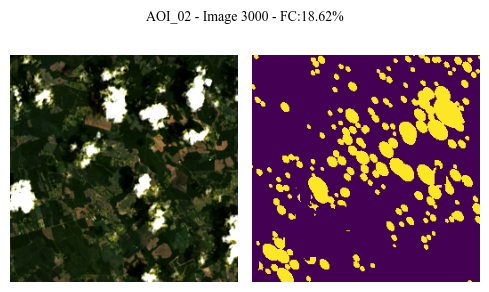

In [ ]:
print(f'Image {img}')
X_ = AOI_[f'{AOI_name}_X'][img]
Y_ = AOI_[f'{AOI_name}_y'][img]
P_ = AOI_[f'{AOI_name}_FC_percentaje'][img]

fig, ax = plt.subplots(figsize=(5, 3), nrows=1, ncols=2)
ax[0].imshow(normalize(get_rgb(X_)))  # Apply normalization
ax[0].axis('off')
ax[1].imshow(Y_, vmin=0, vmax=1)
ax[1].axis('off')

plt.suptitle(f'{AOI_name} - Image {img} - FC:{P_:.2f}%', fontsize=10)
plt.tight_layout()
plt.show()

# X - y df

In [ ]:
X_1 = AOI_[f'{AOI_name}_X'][img]
y_1 = AOI_[f'{AOI_name}_y'][img]

X_1_r = np.reshape(X_1, (7, -1)).T
y_1_r = y_1.reshape(-1,1)

# 64*64 = 4096
print(X_1_r.shape)
print(y_1_r.shape)

(65536, 7)
(65536, 1)


# Predicting U-Net Model

## Load models

In [ ]:
path_models = '/content/drive/MyDrive/UIS/Doctorado_UIS2198589/1_semestre/TopicosAvanzadosGeofisica/FC_CarolinaBais/ML_models/'

models_list = os.listdir(path_models)
models_list = [model for model in models_list if model.endswith('.pth')]
models_list

['model_CNN_CPU_01.pth',
 'model_CNN_GPU_01.pth',
 'model_CNN_GPU_02.pth',
 'model_CNN_GPU_03.pth',
 'model_Unet_7ch_GPU_01.pth',
 'model_Unet_7ch_GPU_01_v2.pth',
 'model_Unet_7ch_GPU_02_v2.pth',
 'model_Unet_7ch_GPU_02.pth',
 'model_Unet_7ch_GPU_03.pth',
 'model_Unet_7ch_GPU_03_v2.pth',
 'model_Unet_7ch_GPU_04_v2.pth',
 'model_Unet_7ch_GPU_04.pth',
 'model_Unet_12ch_GPU_01.pth',
 'model_Unet_v2_7ch_ML_GPU_01.pth',
 'model_Unet_v2_7ch_bandas_GPU_01.pth']

In [ ]:
path_modelo_bandas = os.path.join(path_models, 'model_Unet_v2_7ch_bandas_GPU_01.pth')

# Inicializar el modelo y aplicar la inicialización personalizada
n_class = 1  # Ajusta esto al número de clases de salida que tengas
model_bandas = UNet_v2(n_class).to(device) # mover a GPU
model_bandas.load_state_dict(torch.load(path_modelo_bandas))
# Si se usa GPU
#model.load_state_dict(torch.load('modelo_pesos.pth', map_location=torch.device('cuda')))
#model.eval()  # si es para inferencia -- > ya esta en la fun predecir

<All keys matched successfully>

In [ ]:
path_modelo_indices = os.path.join(path_models, 'model_Unet_v2_7ch_ML_GPU_01.pth')

# Inicializar el modelo y aplicar la inicialización personalizada
n_class = 1  # Ajusta esto al número de clases de salida que tengas
model_indices = UNet_v2(n_class).to(device) # mover a GPU
model_indices.load_state_dict(torch.load(path_modelo_indices))
# Si se usa GPU
#model.load_state_dict(torch.load('modelo_pesos.pth', map_location=torch.device('cuda')))
#model.eval()  # si es para inferencia -- > ya esta en la fun predecir

<All keys matched successfully>

In [ ]:
X_test = torch.tensor(AOI_[f'{AOI_name}_X'][img])
X_test = X_test.unsqueeze(0) # Añadir dimensión de batch size
X_test = X_test.to(device) # mover a GPU

print(X_test.shape)

torch.Size([1, 7, 256, 256])


In [ ]:
# Ejemplo de cómo usar la función para predecir la imagen en el índice 0 del lote
predict_bandas = make_predictions(model_bandas, X_test)

predict_bandas

array([[1.0010464e-05, 1.8593228e-08, 5.5399280e-10, ..., 8.9827665e-09,
        9.2711639e-07, 7.8458857e-04],
       [7.8369439e-08, 1.3090854e-12, 3.8530076e-15, ..., 9.2423164e-16,
        6.0623928e-12, 1.0407500e-06],
       [1.6838962e-08, 4.5790889e-14, 5.2303338e-17, ..., 7.0945884e-21,
        1.1790253e-15, 7.9430498e-09],
       ...,
       [2.0537303e-01, 7.0237495e-02, 2.6344439e-02, ..., 1.5162249e-26,
        6.0480751e-22, 1.5134005e-13],
       [2.6633903e-01, 1.2187767e-01, 5.7001155e-02, ..., 6.7739654e-21,
        1.3443528e-17, 4.0155299e-11],
       [3.8200051e-01, 2.8502306e-01, 2.0182884e-01, ..., 5.5943871e-11,
        2.4106568e-09, 1.4890342e-06]], dtype=float32)

In [ ]:
predict_bandas.shape

(256, 256)

In [ ]:
X_test = X_test.cpu()

# B3 --> axis 2
# B6 --> axis 5
# B4_B1 --> axis 7
X_test = np.concatenate((X_test, normalized_index(X_test[:, 0, :, :], X_test[:, 3, :, :])), axis=1)

# B4_B3 --> axis 8
X_test = np.concatenate((X_test, normalized_index(X_test[:, 2, :, :], X_test[:, 3, :, :])), axis=1)

# B7_B3 --> axis 9
X_test = np.concatenate((X_test, normalized_index(X_test[:, 2, :, :], X_test[:, 6, :, :])), axis=1)

# B6_B4 --> axis 10
X_test = np.concatenate((X_test, normalized_index(X_test[:, 3, :, :], X_test[:, 5, :, :])), axis=1)

# B6_B5 --> axis 11
X_test = np.concatenate((X_test, normalized_index(X_test[:, 4, :, :], X_test[:, 5, :, :])), axis=1)

X_test.shape

(1, 12, 256, 256)

In [ ]:
X_test = torch.tensor(X_test)
X_test = X_test.to(device) # mover a GPU

In [ ]:
X_test = X_test.cpu()

# Tomar las 7 bandas de interes segun los otros algoritmos Reg Log y Rand Forest
X_test = X_test[:,[2, 5, 7 , 8, 9, 10, 11],:,:]
X_test.shape

torch.Size([1, 7, 256, 256])

In [ ]:
X_test = torch.tensor(X_test)
X_test = X_test.to(device) # mover a GPU

/tmp/ipython-input-2637463713.py:1: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  X_test = torch.tensor(X_test)


In [ ]:
# Ejemplo de cómo usar la función para predecir la imagen en el índice 0 del lote
predict_indices = make_predictions(model_indices, X_test)

predict_indices

array([[2.6106578e-03, 1.0352308e-04, 2.0699697e-05, ..., 2.6875180e-09,
        3.2293664e-07, 9.8212680e-04],
       [6.1814790e-05, 1.0271333e-07, 1.8926083e-09, ..., 1.9483652e-18,
        3.4468857e-14, 1.6852704e-07],
       [9.2365499e-06, 1.6653283e-09, 5.2249732e-12, ..., 5.7346065e-26,
        4.3723853e-20, 9.8184731e-11],
       ...,
       [2.0669151e-02, 1.5142788e-03, 2.3420459e-04, ..., 2.6615654e-11,
        2.0844317e-09, 1.1784350e-05],
       [2.6397904e-02, 1.8401860e-03, 3.2909372e-04, ..., 3.5770733e-09,
        9.8781079e-08, 8.1924394e-05],
       [1.2844618e-01, 2.8997896e-02, 1.0399045e-02, ..., 2.9411191e-05,
        1.2855594e-04, 4.0452695e-03]], dtype=float32)

In [ ]:
predict_indices.shape

(256, 256)

## Plot predictions

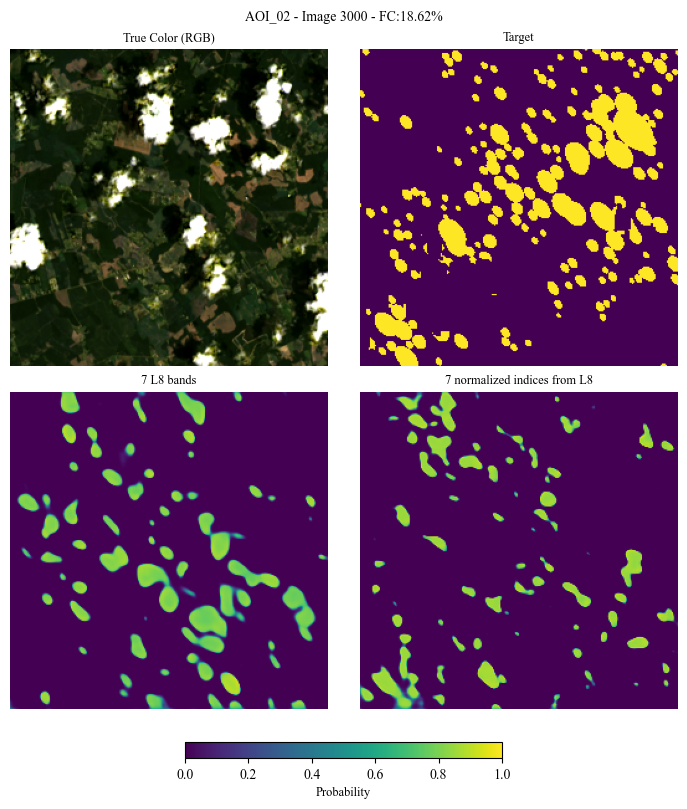

In [ ]:
# Graficar todo como antes pero usando histograma en ax[2]
fig = plt.figure(figsize=(7, 8), layout='constrained')
gs = fig.add_gridspec(2, 6)  # 2 filas, 6 columnas

ax_1 = fig.add_subplot(gs[0, 0:3]) # RGB
ax_2 = fig.add_subplot(gs[0, 3:6]) # Y
ax_3 = fig.add_subplot(gs[1, 0:3]) # Y
ax_4 = fig.add_subplot(gs[1, 3:6]) # Y

ax_1.imshow(normalize(get_rgb(X_)))
ax_1.axis('off')
ax_1.set_title('True Color (RGB)', fontsize=9)

ax_2.imshow(Y_, vmin=0, vmax=1)
ax_2.axis('off')
ax_2.set_title('Target', fontsize=9)

ax_3.imshow(predict_bandas, vmin=0, vmax=1)
ax_3.axis('off')
ax_3.set_title('7 L8 bands', fontsize=9)


im = ax_4.imshow(predict_indices, vmin=0, vmax=1)
ax_4.axis('off')
ax_4.set_title('7 normalized indices from L8', fontsize=9)

cbar = fig.colorbar(im, ax=[ax_3 , ax_4],
                    orientation='horizontal',
                    pad=0.1,
                    fraction=0.05,
                    shrink=0.75)
cbar.set_label('Probability', fontsize=9)

plt.suptitle(f'{AOI_name} - Image {img} - FC:{P_:.2f}%', fontsize=10)
#plt.tight_layout()
plt.show()


# Loop A2

In [ ]:
# AOI
AOI_name = 'AOI_02'
AOI_ = h5py.File(os.path.join(path_save_h5, f'dataset_{AOI_name}_256x256.h5'), 'r')
AOI_[f'{AOI_name}_X'].shape

(15120, 7, 256, 256)

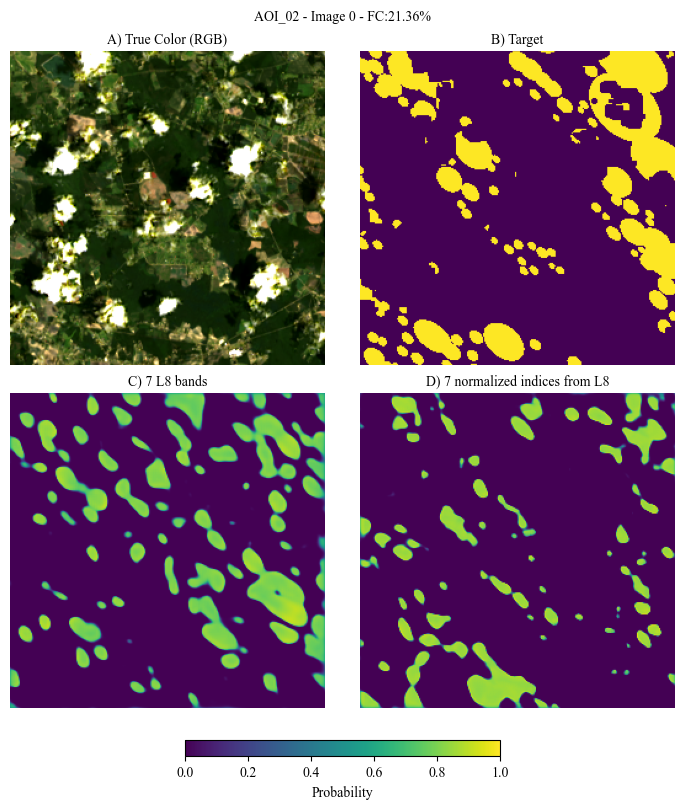

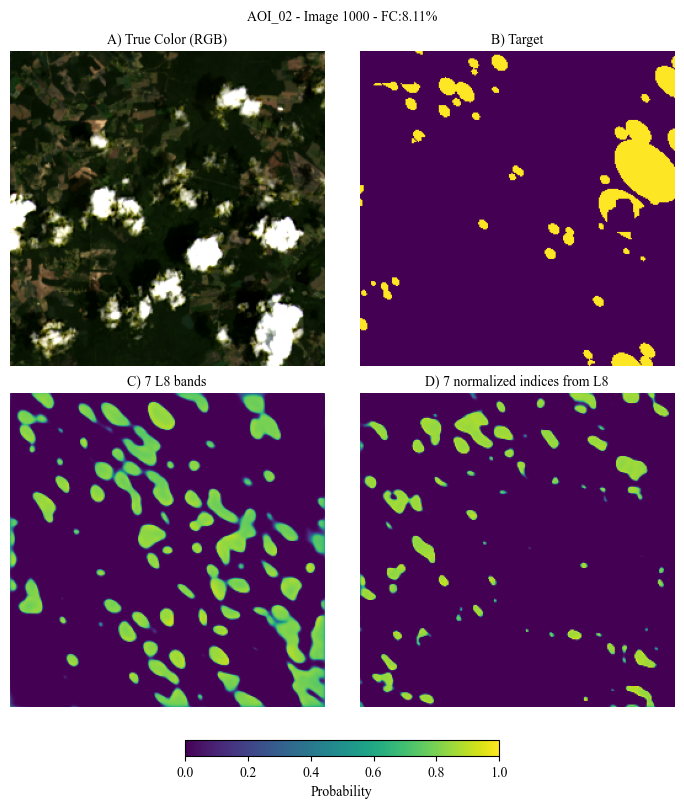

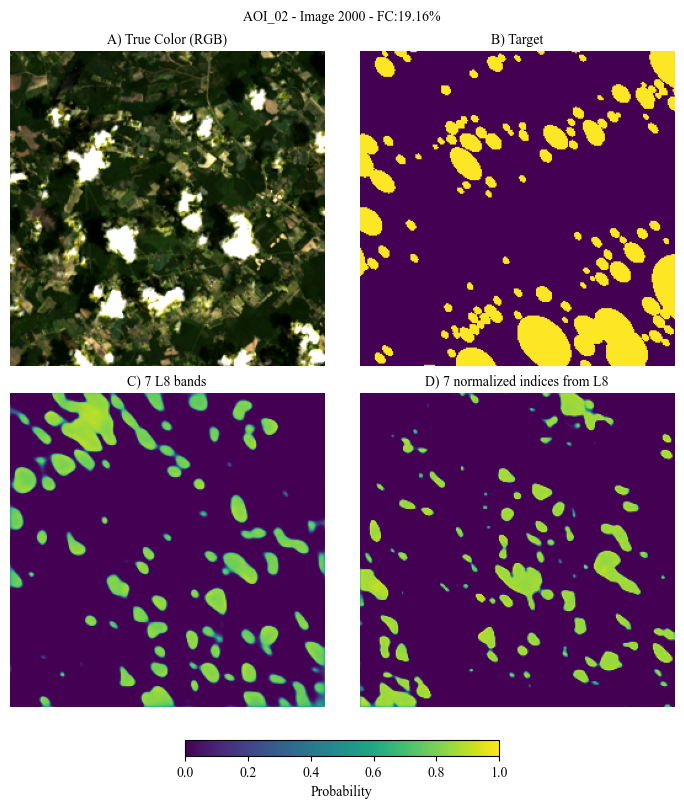

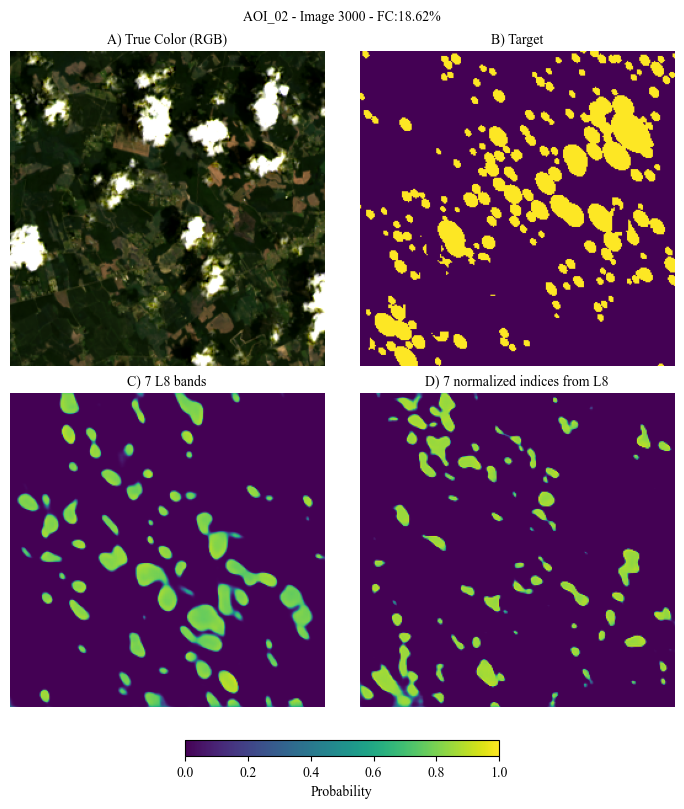

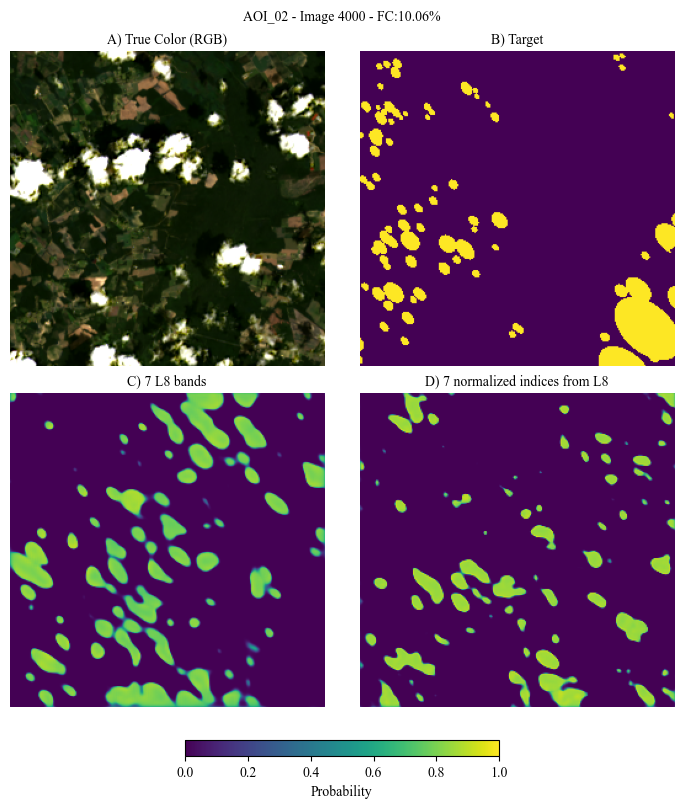

...

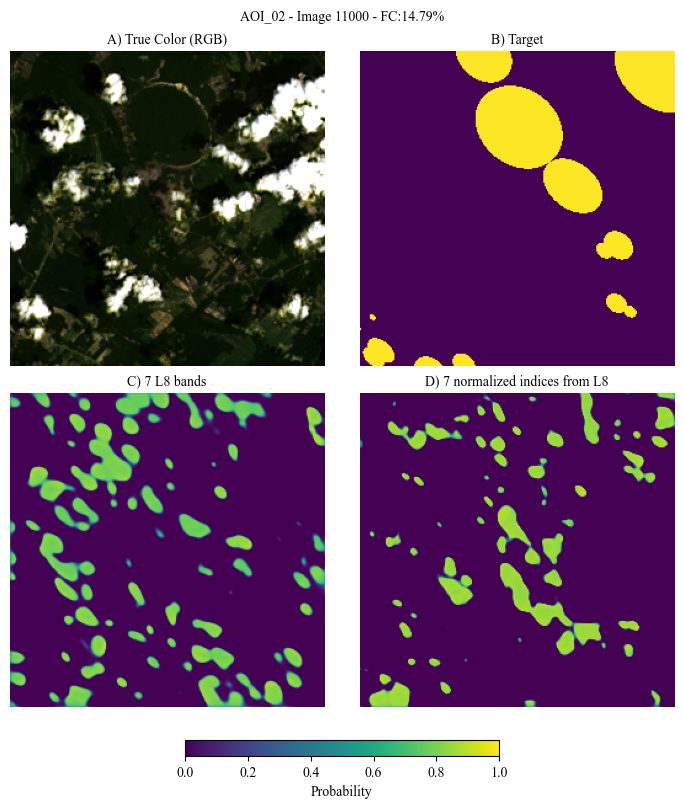

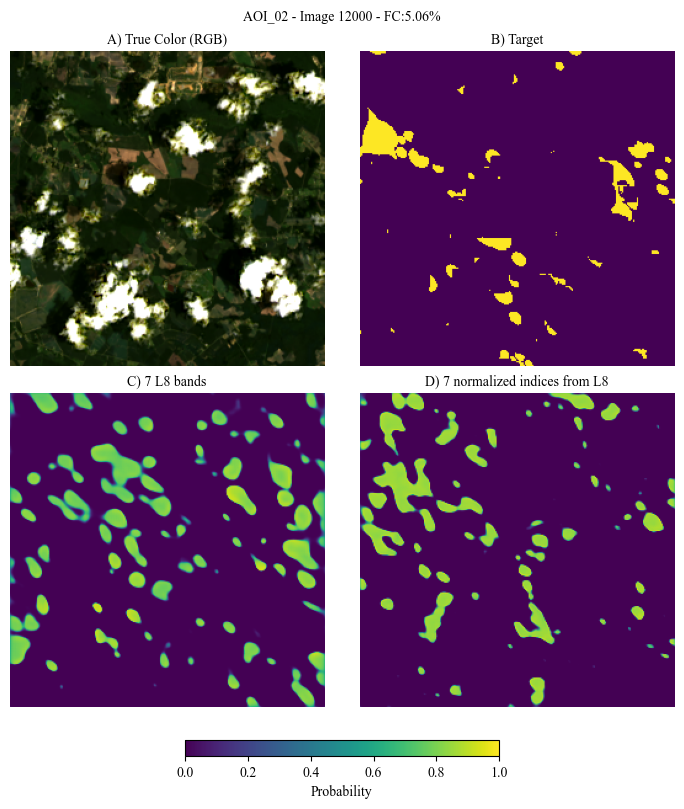

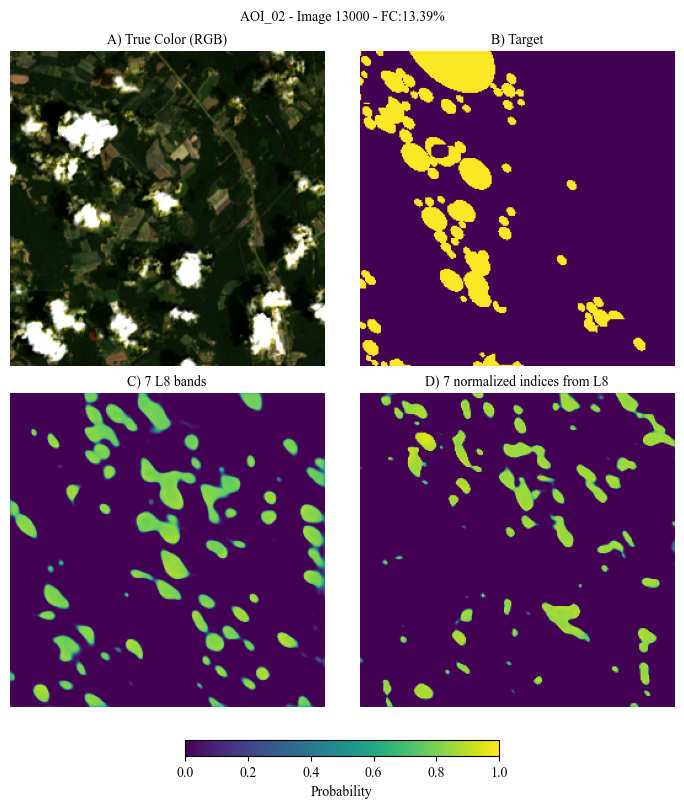

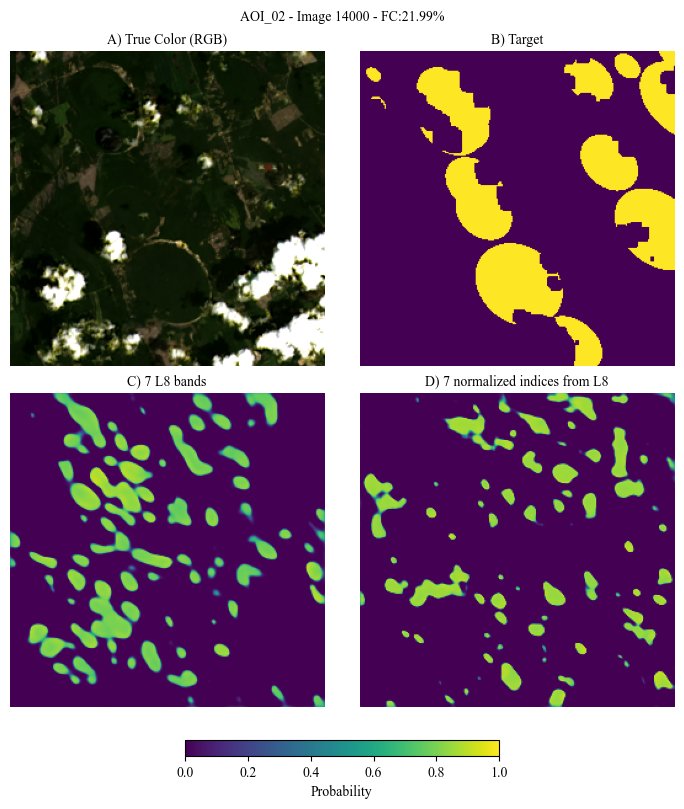

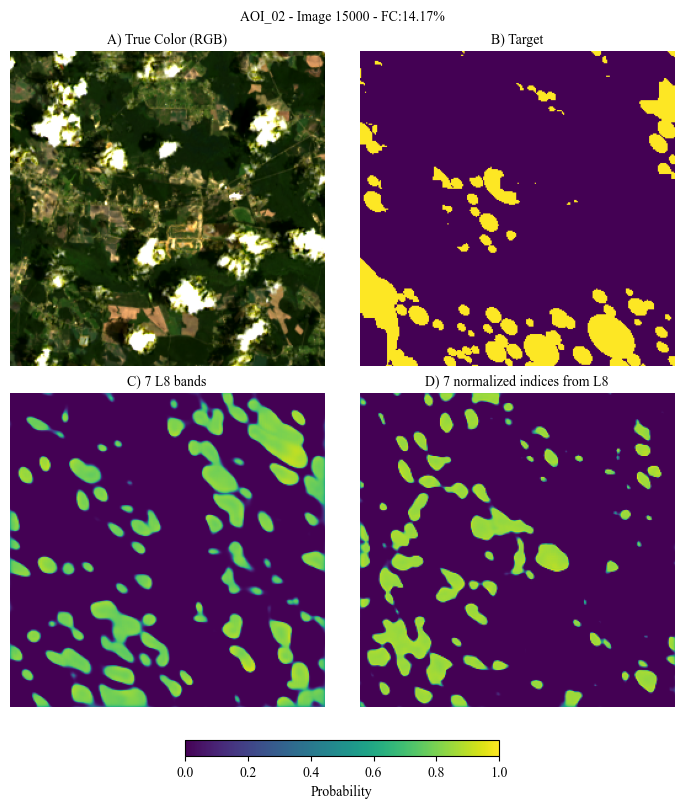

In [ ]:
imgs_of_interests = np.arange(0, AOI_[f'{AOI_name}_X'].shape[0], 1000)

for img in imgs_of_interests:
  X_ = AOI_[f'{AOI_name}_X'][img]
  Y_ = AOI_[f'{AOI_name}_y'][img]
  P_ = AOI_[f'{AOI_name}_FC_percentaje'][img]
  X_test = torch.tensor(AOI_[f'{AOI_name}_X'][img])
  X_test = X_test.unsqueeze(0) # Añadir dimensión de batch size
  X_test = X_test.to(device) # mover a GPU

  predict_bandas = make_predictions(model_bandas, X_test)

  X_test = X_test.cpu()

  # B3 --> axis 2
  # B6 --> axis 5
  # B4_B1 --> axis 7
  X_test = np.concatenate((X_test, normalized_index(X_test[:, 0, :, :], X_test[:, 3, :, :])), axis=1)

  # B4_B3 --> axis 8
  X_test = np.concatenate((X_test, normalized_index(X_test[:, 2, :, :], X_test[:, 3, :, :])), axis=1)

  # B7_B3 --> axis 9
  X_test = np.concatenate((X_test, normalized_index(X_test[:, 2, :, :], X_test[:, 6, :, :])), axis=1)

  # B6_B4 --> axis 10
  X_test = np.concatenate((X_test, normalized_index(X_test[:, 3, :, :], X_test[:, 5, :, :])), axis=1)

  # B6_B5 --> axis 11
  X_test = np.concatenate((X_test, normalized_index(X_test[:, 4, :, :], X_test[:, 5, :, :])), axis=1)

  # Tomar las 7 bandas de interes segun los otros algoritmos Reg Log y Rand Forest
  X_test = X_test[:,[2, 5, 7 , 8, 9, 10, 11],:,:]

  X_test = torch.tensor(X_test)
  X_test = X_test.to(device) # mover a GPU

  # Ejemplo de cómo usar la función para predecir la imagen en el índice 0 del lote
  predict_indices = make_predictions(model_indices, X_test)

  # Graficar todo como antes pero usando histograma en ax[2]
  fig = plt.figure(figsize=(7, 8), layout='constrained')
  gs = fig.add_gridspec(2, 6)  # 2 filas, 6 columnas

  ax_1 = fig.add_subplot(gs[0, 0:3]) # RGB
  ax_2 = fig.add_subplot(gs[0, 3:6]) # Y
  ax_3 = fig.add_subplot(gs[1, 0:3]) # Y
  ax_4 = fig.add_subplot(gs[1, 3:6]) # Y

  ax_1.imshow(normalize(get_rgb(X_)))
  ax_1.axis('off')
  ax_1.set_title('A) True Color (RGB)', fontsize=10)

  ax_2.imshow(Y_, vmin=0, vmax=1)
  ax_2.axis('off')
  ax_2.set_title('B) Target', fontsize=10)

  ax_3.imshow(predict_bandas, vmin=0, vmax=1)
  ax_3.axis('off')
  ax_3.set_title('C) 7 L8 bands', fontsize=10)


  im = ax_4.imshow(predict_indices, vmin=0, vmax=1)
  ax_4.axis('off')
  ax_4.set_title('D) 7 normalized indices from L8', fontsize=10)

  cbar = fig.colorbar(im, ax=[ax_3 , ax_4],
                      orientation='horizontal',
                      pad=0.1,
                      fraction=0.05,
                      shrink=0.75)
  cbar.set_label('Probability', fontsize=10)

  plt.suptitle(f'{AOI_name} - Image {img} - FC:{P_:.2f}%', fontsize=10)
  #plt.tight_layout()
  if img == 0:
    plt.savefig((pathSaveFiguras + f'Figura_U-NET_v2_{AOI_name}.png'),
            format='png', dpi=1000, bbox_inches = 'tight',pad_inches=0.25)
  plt.show()

  print('\n')


# Loop A4

In [ ]:
# AOI
AOI_name = 'AOI_04'
AOI_ = h5py.File(os.path.join(path_save_h5, f'dataset_{AOI_name}_256x256.h5'), 'r')
AOI_[f'{AOI_name}_X'].shape

(15120, 7, 256, 256)

In [ ]:
AOI_['AOI_04_y'][0].sum()

np.float32(0.0)

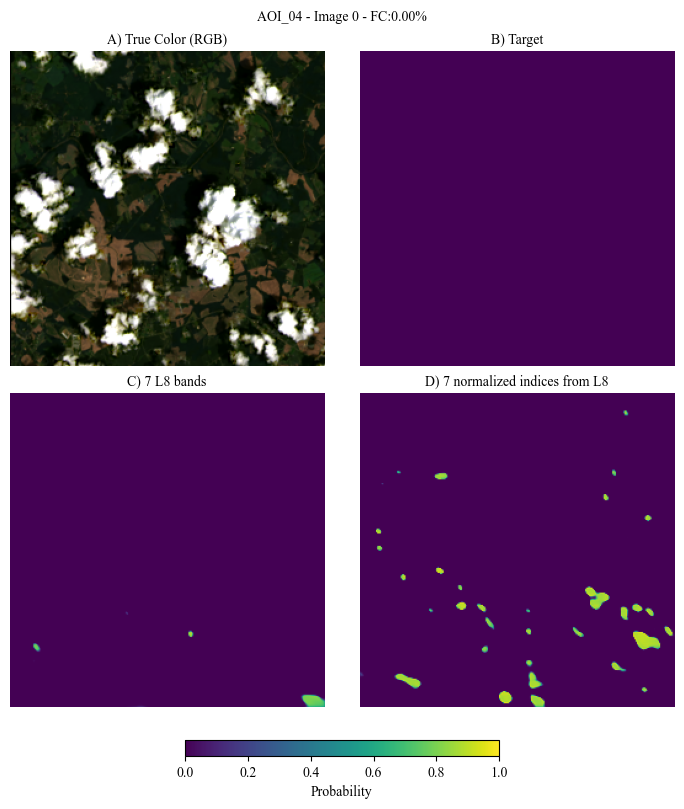

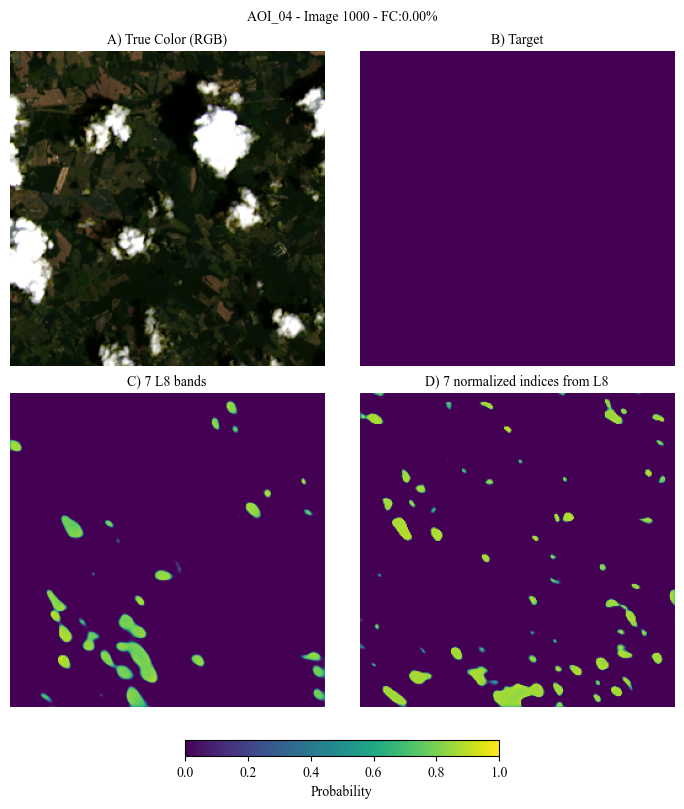

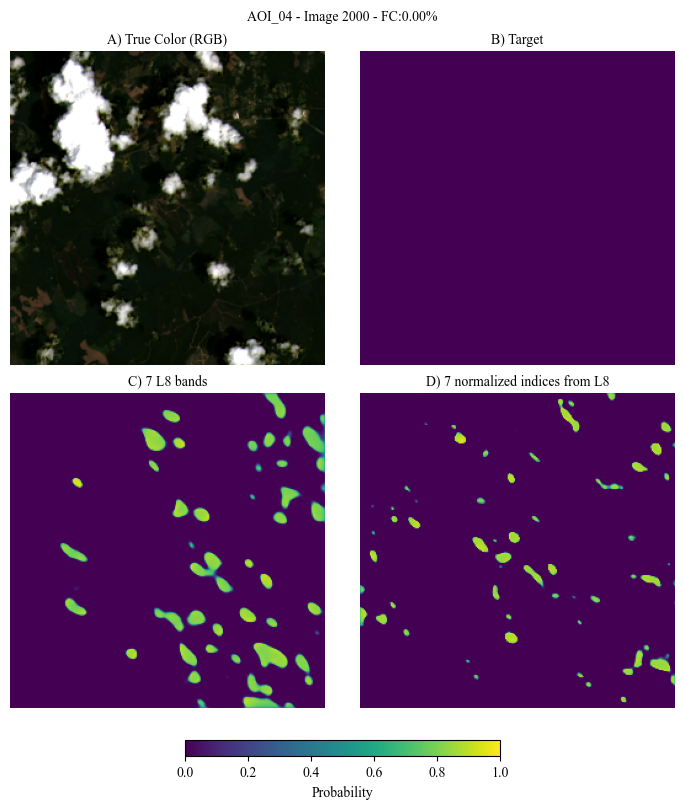

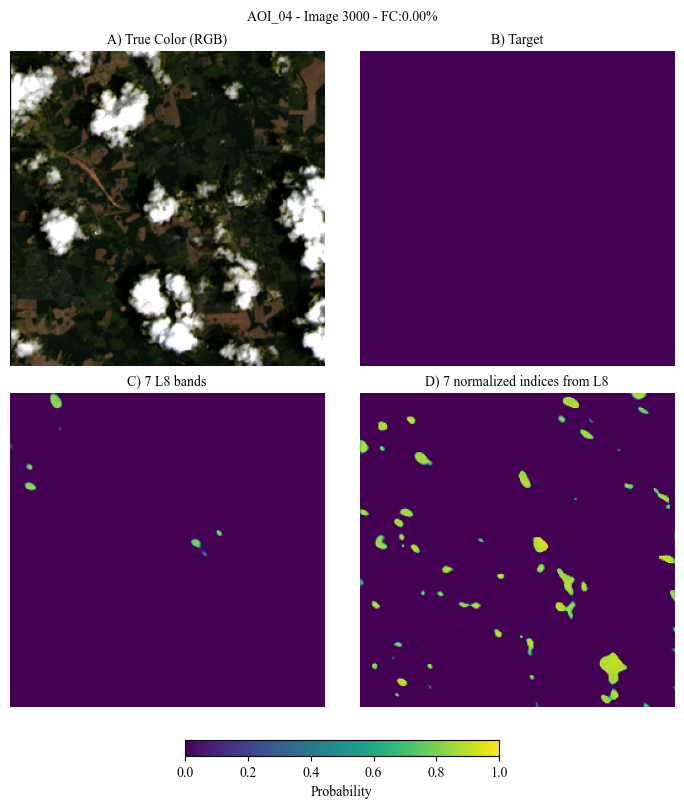

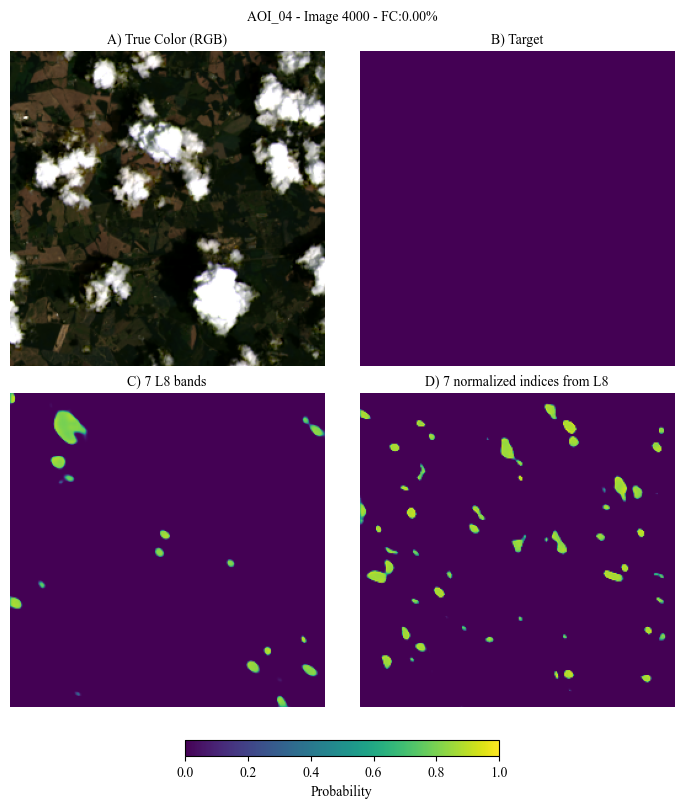

...

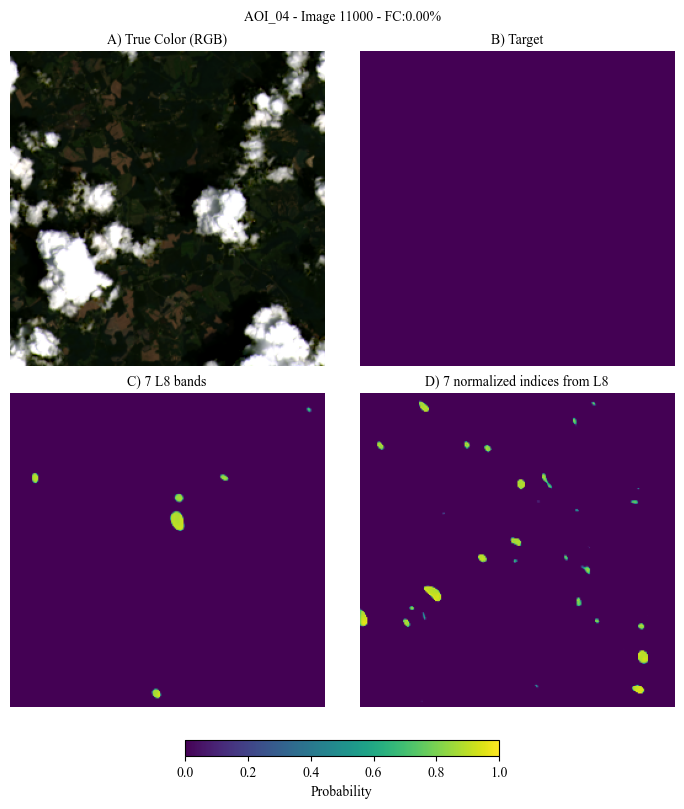

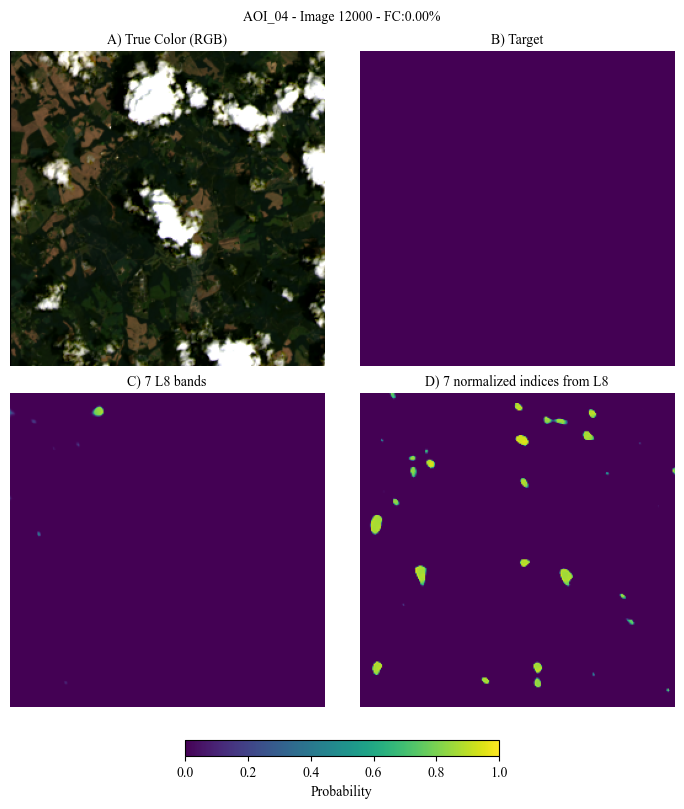

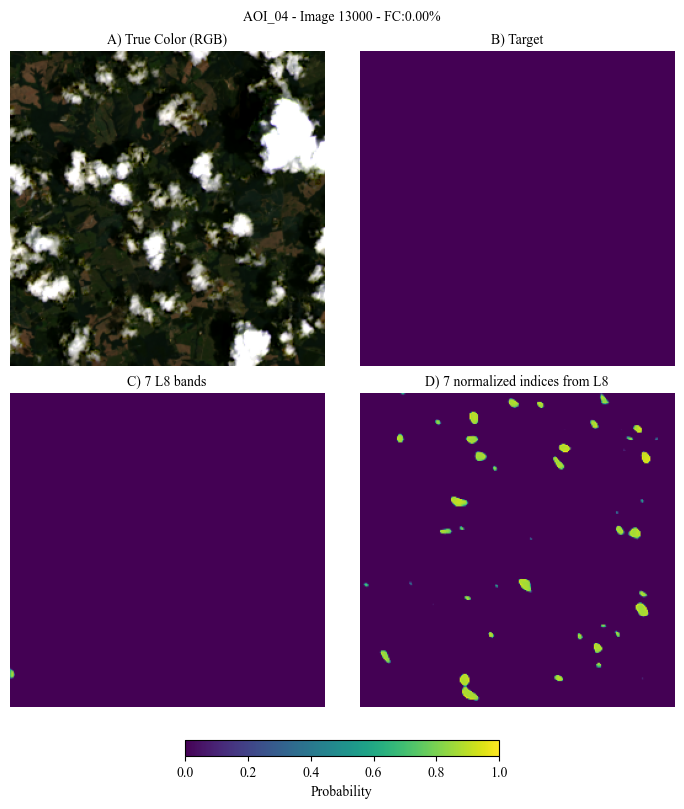

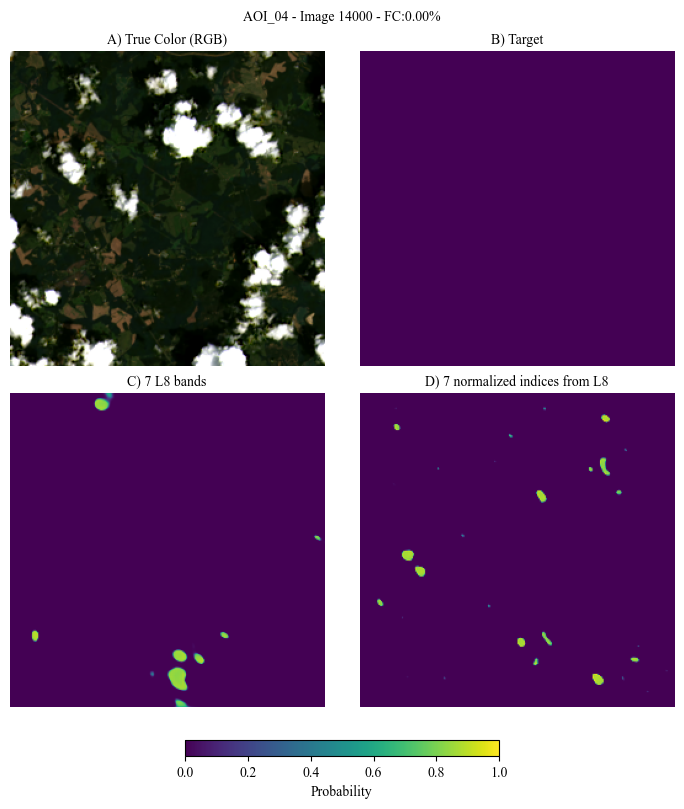

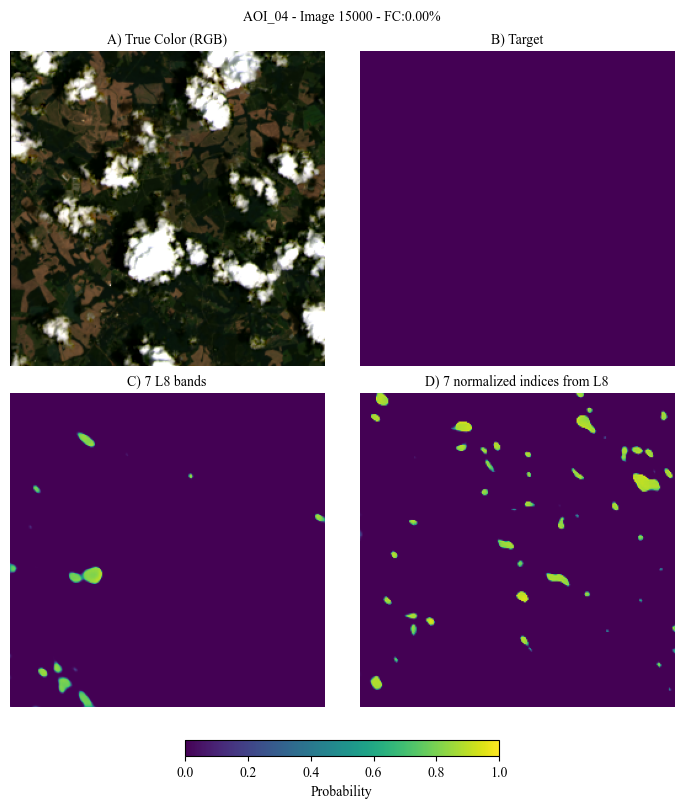

In [ ]:
imgs_of_interests = np.arange(0, AOI_[f'{AOI_name}_X'].shape[0], 1000)

for img in imgs_of_interests:
  X_ = AOI_[f'{AOI_name}_X'][img]
  Y_ = AOI_[f'{AOI_name}_y'][img]
  P_ = AOI_[f'{AOI_name}_FC_percentaje'][img]
  X_test = torch.tensor(AOI_[f'{AOI_name}_X'][img])
  X_test = X_test.unsqueeze(0) # Añadir dimensión de batch size
  X_test = X_test.to(device) # mover a GPU

  predict_bandas = make_predictions(model_bandas, X_test)

  X_test = X_test.cpu()

  # B3 --> axis 2
  # B6 --> axis 5
  # B4_B1 --> axis 7
  X_test = np.concatenate((X_test, normalized_index(X_test[:, 0, :, :], X_test[:, 3, :, :])), axis=1)

  # B4_B3 --> axis 8
  X_test = np.concatenate((X_test, normalized_index(X_test[:, 2, :, :], X_test[:, 3, :, :])), axis=1)

  # B7_B3 --> axis 9
  X_test = np.concatenate((X_test, normalized_index(X_test[:, 2, :, :], X_test[:, 6, :, :])), axis=1)

  # B6_B4 --> axis 10
  X_test = np.concatenate((X_test, normalized_index(X_test[:, 3, :, :], X_test[:, 5, :, :])), axis=1)

  # B6_B5 --> axis 11
  X_test = np.concatenate((X_test, normalized_index(X_test[:, 4, :, :], X_test[:, 5, :, :])), axis=1)

  # Tomar las 7 bandas de interes segun los otros algoritmos Reg Log y Rand Forest
  X_test = X_test[:,[2, 5, 7 , 8, 9, 10, 11],:,:]

  X_test = torch.tensor(X_test)
  X_test = X_test.to(device) # mover a GPU

  # Ejemplo de cómo usar la función para predecir la imagen en el índice 0 del lote
  predict_indices = make_predictions(model_indices, X_test)

  # Graficar todo como antes pero usando histograma en ax[2]
  fig = plt.figure(figsize=(7, 8), layout='constrained')
  gs = fig.add_gridspec(2, 6)  # 2 filas, 6 columnas

  ax_1 = fig.add_subplot(gs[0, 0:3]) # RGB
  ax_2 = fig.add_subplot(gs[0, 3:6]) # Y
  ax_3 = fig.add_subplot(gs[1, 0:3]) # Y
  ax_4 = fig.add_subplot(gs[1, 3:6]) # Y

  ax_1.imshow(normalize(get_rgb(X_)))
  ax_1.axis('off')
  ax_1.set_title('A) True Color (RGB)', fontsize=10)

  ax_2.imshow(Y_, vmin=0, vmax=1)
  ax_2.axis('off')
  ax_2.set_title('B) Target', fontsize=10)

  ax_3.imshow(predict_bandas, vmin=0, vmax=1)
  ax_3.axis('off')
  ax_3.set_title('C) 7 L8 bands', fontsize=10)


  im = ax_4.imshow(predict_indices, vmin=0, vmax=1)
  ax_4.axis('off')
  ax_4.set_title('D) 7 normalized indices from L8', fontsize=10)


  cbar = fig.colorbar(im, ax=[ax_3 , ax_4],
                      orientation='horizontal',
                      pad=0.1,
                      fraction=0.05,
                      shrink=0.75)
  cbar.set_label('Probability', fontsize=10)

  plt.suptitle(f'{AOI_name} - Image {img} - FC:{P_:.2f}%', fontsize=10)
  #plt.tight_layout()
  if img == 2000:
    plt.savefig((pathSaveFiguras + f'Figura_U-NET_v2_{AOI_name}.png'),
            format='png', dpi=1000, bbox_inches = 'tight',pad_inches=0.25)
  plt.show()

  print('\n')


# End